# **Astrocyte-Mediated Higher-Order Control of Synaptic Plasticity**

Authors: Menesse, G; Milan AP, Torres JJ.

This notebook contains the script for solving the a networked system of neurons and astrocytes using the Euler integration method. The system is described in the main article: <url>https://doi.org/10.48550/arXiv.2507.07693<url>

In [137]:
include("AstroCircuit_Functions.jl")

SimAstroNet! (generic function with 3 methods)

## **Create topology**

In [138]:
# Number of neurons
NN = 3

# Number of astrocytes
NA = 1

# Neuron network topology (directed)
GN = cycle_digraph(NN)
#GN = erdos_renyi(NN, 0.25,is_directed=true)

# Each element is a ij element (Synapse)
AN = adjacency_matrix(GN)

# Guarantee all neurons have at least one synapse
while 0 ∈ reduce(+,AN,dims=2)
    GN = erdos_renyi(NN, 0.25,is_directed=true)
    AN = adjacency_matrix(GN)
end

# Index of synapses
SyIndx = findall(e -> e == 1 ,AN)

# Astrocytic network (undirected)
# GA = cycle_digraph(1)
GA = erdos_renyi(NA, 0.5)

# Each element is a-a (Astrocityc gap-junction)
AG = adjacency_matrix(GA);

Isy = []

# Synapse label of each neuron
for ni in 1:NN
    
    isyn = findall(e -> e == ni,first.(Tuple.(SyIndx)))
    
    append!(Isy,isyn)
    
end

# Astrocytic-Synapse network
NL = sum(AN)

#Probability of conection of the astrocyte to a specific synapse
pp = 1.

# Each element is a ija element
# Matrix of synapses (links) connected to an astrocite a
AL = zeros(Int64,NL,NA)

#initial connections
al = Int64.(rand(NL,NA) .< pp);

#Number of astrocite interacting with a same synapse
numal = reduce(+,al,dims=2)

#Only one astro-syn conection per synapse should remain
for i in 1:length(numal)

    idx = findall(e -> e == 1, al[i,:])

    if numal[i] > 1

        AL[i,sample(idx,1)[1]] = 1

    else

        AL[i,idx] .= 1

    end

end

#Disconect the synapse 1->2 from astrocyte 
AL[2] = 0;


## **Matrices for system variables**

In [139]:
####################
# Auxiliar vectors
####################
# To monitoring last spkTime
tsp = zeros(NN)

# To monitoring last global glio. release
tspa = zeros(NA)

# To save neuron state (0:Quiet, 1:Spike)
spk = zeros(Int8,NN)

th1 = ones(Int8,NA)
th2 = zeros(Int8,NA)
Gel = zeros(Int8,NA)

###################
# i variables
###################
# Membrane potential
V = zeros(NN)

#Exteral inputs
yi = zeros(NN)

##################
# ij variables
##################
# Synaptic currents
y = zeros(size(AN))

# Release probability
U = zeros(size(AN))

#Activated fraction of facilitation related receptors in pre-synaptic spines
gampre = zeros(size(AN))
gamas = zeros(size(AN))

#In case of including long-term plasticity or heterogeinity in the rel. prob. steady state 
USE = zeros(size(AN))

# Fraction of neurotransmiter available for release
x = ones(size(AN))

###################
# a variables
###################
# Calcium
Ca = zeros(NA)

# Glio release state (0:Quiet,1:Release)
Grel = zeros(NA)

###################
# a-ij variables
###################
IP3 = zeros(size(AL))

# Glio depression variable
xa = ones(size(AL));


## **Model parameters**

In [140]:
# Neuronal paratemers
# Resistence and capacitace of membrane
R = 200 # MOhm
C = 0.1 # nF

# This values give a time scale of V dynamic (tauV) of 10 ms
tauV = R*C # ms

# Facilitation time constant
tau1f = 200 # ms
tau2f = 1000 # ms

# Recovery time constant
taur = 100 # ms

thrs = 5 # mV

# Time scale of synaptic current
tausin = 5 # ms

# Initial steady state release probability
Use = 0.1

# Astrocite parameters
tauIP3 = 6 # ms
taura = 100 # ms
tauCa = 100 # ms

# Calcium Pump
# Cs = 0.01
# Ks = sqrt(0.06)

# Diffusion coefficient
Dca = 0. # 0.01

# beta = 11 # If IP3 instantaneous
beta = 0.05

# Calcium threshold
Cathr = 0.04

# Gliotransmitters release probabiity
Usa = 0.1

# Depre/Pot threshold
eps = 0.01

# Abs. Refractory period
ta = 5 # ms

# In case of not using heavside release, the release will happen each tas miliseconds while
# calcium is above threshold
# Glio. release period
tas = 5 # ms

# Hyperpolarization after spike
Vreset = -5 

# Fraction stay in synaptic cleft
alph = 0.7

# Max. current amplitude (is such that am*alpha*x*U of order 10^-1 nA
am =  3 # round(0.3/(use0*alph))

# Max.current amplitude of external stimuli
ame = 0.3;


In [141]:
# Simulation parameters
dt = 5e-3

# Simulation duration (milisecond)
tt = 20000

# Simulation duration (timestepss) 
T = Int(tt/dt);


## **Stimuli protocol**

In [142]:
IT = zeros(T,NN);

freq = 10

# Stimuli frequency
f = freq*ones(NN)

#Stimuli start time and finish time
sini = 0 #ms
#sifi = 25000 #ms
sifi = tt #ms

# Delay between neurons stimuli 
Df = rand(rg1,1:500,NN)./dt

#For periodic stimuli
spkT = PeriodicStim(f,Df,NN,T,Int(sini/dt)+1,Int(sifi/dt));

#For poissonian stimuli
#spkT = PoissonStim(f,T,NN)

# Stimuli only in the neuron 1
spkT[:,2:end] *= 0;

a = (thrs)/R
b = (thrs+1e-3)/R

#In case of using a stepss Current of random amplitude between a and b  values.
#IT = Steady_randAmpl(a,b,NN);

#No stepss current
IT = zeros(Float64,NN);


## **Matrices to save data**

In [143]:
# Neuron states
spkiT = zeros(Int32,T,NN)

#Save time interval (each dts timestepss)
dts = 100

Ts = Int32(T/dts)

VT = zeros(Ts,NN)
yiT = zeros(Ts,NN)
xT = zeros(Ts,size(x)[1],size(x)[2])
yT = zeros(Ts,size(y)[1],size(y)[2])
UT = zeros(Ts,size(U)[1],size(U)[2])
gampreT = zeros(Ts,size(U)[1],size(U)[2])
gamasT = zeros(Ts,size(U)[1],size(U)[2])
IP3T = zeros(Ts,size(IP3)[1],size(IP3)[2])
CaT = zeros(Ts,size(Ca)[1])
xaT = zeros(Ts,size(xa)[1],size(xa)[2]);
GlioRel = zeros(Ts,NA)

# Initialize
V .*= 0. #rand(size(V)[1]).*thrs
x .= 1.
xa .= 1.
IP3 .*= 0.
Ca .*= 0.
y *= 0.

U[:,:] = Use.*AN;
USE[:,:] = Use.*AN;

VT[1,:] .= V
yiT[1,:] .= 0.
xT[1,:,:] .= x
yT[1,:,:] .= 0
UT[1,:,:] .= U
IP3T[1,:,:] .= IP3
CaT[1,:] .= Ca
xaT[1,:,:] .= xa;


## **RUN SIMULATION**

In [144]:
using DelimitedFiles

#Using heaviside function for gliorelease
Heavi = true

params = [Use,Usa,eps,alph]

dir = "Datos_fig/"

isdir(dir) || mkdir(dir)

#Prepare the filename with information about the paratemers values used 
filename = dir*"Sim_N_$(NN)_NA_$(NA)_Nm_$(sum(AL))_f_$(freq)_am_$(am)_use_$(Use)_usa_$(Usa)_eps_$(eps)_alpha_$(alph)_D_$(Dca)_"

@time SimAstroNet!(filename,AN,AL,AG,spkiT,IT,T,VT,xT,yT,yiT,UT,gamasT,gampreT,IP3T,CaT,xaT,GlioRel,V,x,xa,IP3,Ca,y,yi,tsp,tspa,spk,U,gamas,gampre,USE,Grel,th1,th2,dts,params,Heavi,spkT)


 17.640532 seconds (606.98 M allocations: 26.789 GiB, 12.76% gc time, 9.84% compilation time)


# **PLOT RESULTS**

In [145]:
DataSpk = readdlm(filename*"_spk.txt")

NeuId = DataSpk[:,1]
Tspk = DataSpk[:,2];


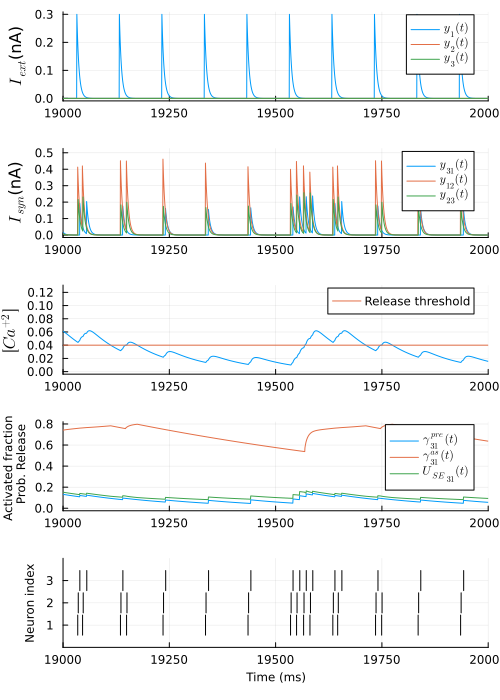

In [136]:
times = LinRange(0,tt,T)[1:dts:end]

steps = 1

#Time interval of plot
ini = tt-1000 #ms
ifi = tt #ms

p1 = plot()

#Fontsize
fs = 8

for j in 1:NN
    
    plot!(times[1:steps:end],ame.*yiT[1:steps:end,j],ylabel=L"$I_{ext}$(nA)",xlim=(ini,ifi),label=latexstring("\$y_{$(j)}(t)\$"))

end

p2 = plot()

for j in 1:length(SyIndx)
    
    #plot!(times,UT[:,SyIndx[j]].*xT[:,SyIndx[j]],ylim=(0,1),label=latexstring("\$(x.U)_{$(SyIndx[j][1])$(SyIndx[j][2])}(t)\$"))
    plot!(times[1:steps:end],am.*yT[1:steps:end,SyIndx[j]],ylabel=L"$I_{syn}$(nA)",xlim=(ini,ifi),label=latexstring("\$y_{$(SyIndx[j][1])$(SyIndx[j][2])}(t)\$"))

end

p3 = plot(times[1:steps:end],CaT[1:steps:end,:],xlim=(ini,ifi),ylabel=L"$[Ca^{+2}]$",label="") 

plot!([times[1],times[end]],[Cathr,Cathr],xlim=(ini,ifi),label="Release threshold") 

p4 = plot()

j = 1

plot!(times[1:steps:end],gampreT[1:steps:end,SyIndx[j]],xlim=(ini,ifi),label=latexstring("\$γ^{pre}_{$(SyIndx[j][1])$(SyIndx[j][2])}(t)\$"))

plot!(times[1:steps:end],gamasT[1:steps:end,SyIndx[j]],xlim=(ini,ifi),label=latexstring("\$γ^{as}_{$(SyIndx[j][1])$(SyIndx[j][2])}(t)\$"))

plot!(times[1:steps:end],UT[1:steps:end,SyIndx[j]],xlim=(ini,ifi),label=latexstring("\${U_{SE}}_{$(SyIndx[j][1])$(SyIndx[j][2])}(t)\$"),yaxis=("Activated fraction \n Prob. Release",font(fs)))

p5 = plot()

for i in 1:length(Tspk)

    plot!([Tspk[i],Tspk[i]],[NeuId[i]-0.45,NeuId[i]+0.45],xlim=(ini,ifi),color=:black,label="",xaxis=("Time (ms)",font(fs)),yaxis = ("Neuron index", (0,NN+1), 1:1:NN,font(fs)))

end

plot(p1,p2,p3,p4,p5,layout=(5,1),size=(500,700))

#savefig("Superlimiar_current_beta_$(beta)_U_use_$(use0)_epsil_$(eps)_Usa_$(Usa)_Cathr_$(Cathr)_Cpump_$(Cs).png")

display(plot!())
